In [1]:
# set the root directory the parent of the current folder
import os, sys
root_dir = os.path.dirname(os.path.dirname(os.path.abspath(__name__)))
if root_dir not in sys.path:
    sys.path.append(root_dir)


In [2]:
from diffusers_local.src.diffusers import (StableDiffusionPipeline)
from diffusers import StableDiffusionPipeline as StableDiffusionOriginalPipeline
import gc
import matplotlib.pyplot as plt

/storage/.conda/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
0it [00:00, ?it/s]


In [4]:
import torch
if torch.cuda.is_available():
    print("CUDA enabled")
else:
    print("WARNING CUDA is not enabled check if you downloaded it correctly")



CUDA enabled


In [48]:
def make_grid(images, titles=None, nrow=2):
    plt.figure(figsize=(20, 20))
    ncol=(len(images)//nrow)
    if len(images) > 4:
        print(f"len images: {len(images)}")
    for index, image in enumerate(images):
        plt.subplot(nrow, ncol, index+1)
        plt.imshow(image)
        plt.title(index)
        plt.axis('off')
    # Adjust the spacing between the subplots
    plt.subplots_adjust(left=0.01, right=0.99, bottom=0.1, top=0.99, wspace=0.01, hspace=0.01)
    return plt

# Trying Out the Lab's Diffusion Lens

In [6]:
import torch
model_name = 'stabilityai/stable-diffusion-2-1' 
seed = 42
generator = torch.manual_seed(seed)
start_layer = 0
end_layer = 23
step_layer = 4

paper_pipe = StableDiffusionPipeline.from_pretrained(
            model_name,
            # variant="fp16",
            # repo_type="huggingface",
            torch_dtype=torch.float16,
            # use_safetensors=True,
            generator=generator,
            start_layer=start_layer,
            end_layer=end_layer,
            step_layer=step_layer
        )
paper_pipe = paper_pipe.to('cuda')

/storage/.conda/lib/python3.12/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Fetching 13 files: 100%|██████████| 13/13 [00:23<00:00,  1.79s/it]
Keyword arguments {'generator': <torch._C.Generator object at 0x7f956cd0b210>, 'start_layer': 0, 'end_layer': 23, 'step_layer': 4} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


In [24]:
# ok now just run the pipeline for a test
prompt = "A Yellow Pickup Truck and a Pink Horse in the Desert"


results = paper_pipe(prompt, start_layer=0, end_layer=23, step_layer=4, num_images_per_prompt=1)

NameError: name 'paper_pipe' is not defined

len images: 6


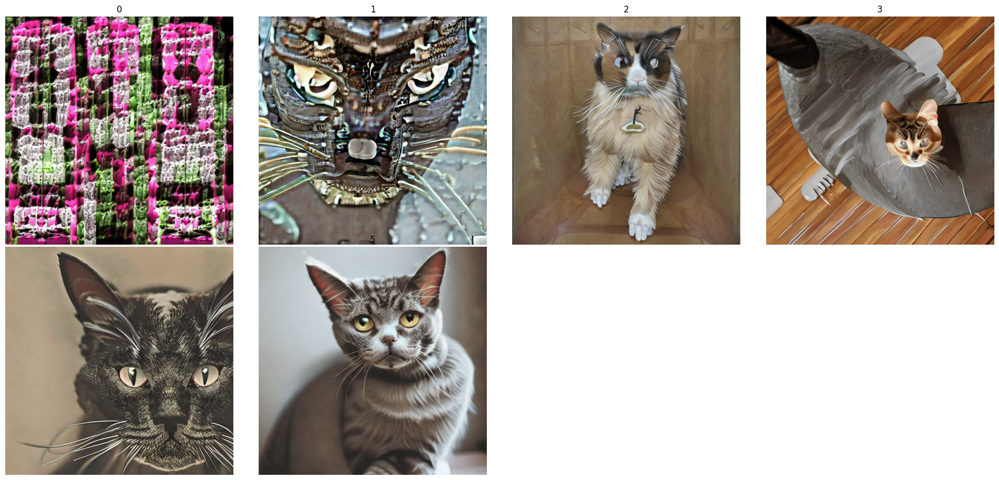

In [8]:
images_list = [r.images[0] for r in results]
image_plots = make_grid(images_list)
image_plots.show()

# Original Pipe

In [9]:
# first delete the previous pipe to free the space
del paper_pipe
gc.collect()

14244

In [21]:
def run_model_through_different_layer_sd2(prompt, model, layer_num, num_images_per_prompt=4):
    # get the encoded text
    tokenized = model.tokenizer(prompt, return_tensors='pt').to('cuda')
    encoded_texts_original = model.text_encoder(**tokenized, output_hidden_states=True,)
    encoded_texts_hidden_states = encoded_texts_original.hidden_states
    selected_layer = encoded_texts_hidden_states[layer_num]
    encoded_texts_normalized = model.text_encoder.text_model.final_layer_norm(selected_layer)
    # Now we have the prompt embeds, run the model
    
    result = model(prompt_embeds=encoded_texts_normalized, num_images_per_prompt=num_images_per_prompt)
    return result

In [14]:
original_pipe_sd2 = StableDiffusionOriginalPipeline.from_pretrained(model_name, torch_dtype=torch.float16, variant='fp16')
original_pipe_sd2 = original_pipe_sd2.to('cuda')

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  9.18it/s]


In [22]:
layers = [0,4,8,12,16,20]
results = []
prompt = "A Yellow Pickup Truck and a Pink Horse in the Desert"

for layer_num in layers:
    print(f"Layer {layer_num}")
    result_single = run_model_through_different_layer_sd2(prompt, original_pipe_sd2, layer_num=layer_num, num_images_per_prompt=1)
    results.append(result_single)
    gc.collect()

Layer 0


  8%|▊         | 4/50 [00:00<00:07,  6.17it/s]

100%|██████████| 50/50 [00:07<00:00,  6.31it/s]


Layer 4


100%|██████████| 50/50 [00:07<00:00,  6.31it/s]


Layer 8


100%|██████████| 50/50 [00:07<00:00,  6.28it/s]


Layer 12


100%|██████████| 50/50 [00:07<00:00,  6.26it/s]


Layer 16


100%|██████████| 50/50 [00:08<00:00,  6.23it/s]


Layer 20


100%|██████████| 50/50 [00:08<00:00,  6.21it/s]


len images: 6


<module 'matplotlib.pyplot' from '/storage/.conda/lib/python3.12/site-packages/matplotlib/pyplot.py'>

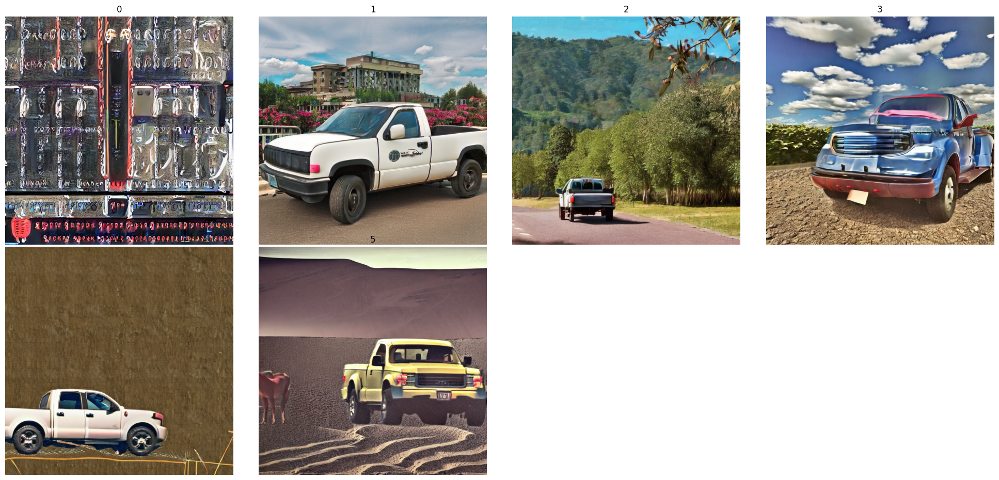

In [23]:
result_plot = [r.images[0] for r in results]
make_grid(result_plot)

# the SDXL

The problem with SDXL is that it uses 2 CLIP models at the same time and concatenates the hidden states and only then passes them into diffuser. So we need to select 2 layers when generating the lens

In [25]:
# first delete the SD2
del original_pipe_sd2
gc.collect()

14794

In [29]:
from diffusers import DiffusionPipeline
import torch

original_pipe_sdxl = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16,  variant="fp16")
original_pipe_sdxl = original_pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  5.73it/s]


In [27]:
def get_hidden_states_sdxl(prompt, model, first_model_layer=-2, second_model_layer=-2):
    text_inputs = model.tokenizer(
                    prompt,
                    padding="max_length",
                    max_length=model.tokenizer.model_max_length,
                    truncation=True, 
                    return_tensors="pt",
                ).to(model.device)

    prompt_embeds = model.text_encoder(
                    **text_inputs,
                    output_hidden_states=True,
                )

    text_inputs_2 = model.tokenizer_2(
                    prompt,
                    padding="max_length",
                    max_length=model.tokenizer_2.model_max_length,
                    truncation=True, 
                    return_tensors="pt",
                ).to(model.device)

    prompt_embeds_2 = model.text_encoder_2(
                    **text_inputs_2,
                    output_hidden_states=True,
                )

    pooled_prompt_embeds = prompt_embeds_2.hidden_states[0][:, 0, :]
    prompt_embeds_1 = prompt_embeds.hidden_states[first_model_layer]
    prompt_embeds_2 = prompt_embeds_2.hidden_states[second_model_layer]
    
    prompt_embeds_complete = torch.concat([prompt_embeds_1, prompt_embeds_2], dim=-1)
    
    return prompt_embeds_complete, pooled_prompt_embeds



In [30]:
# print number of layers for each of the diffuser
num_layers_encoder_1 = len(original_pipe_sdxl.text_encoder.text_model.encoder.layers)
num_layers_encoder_2 = len(original_pipe_sdxl.text_encoder_2.text_model.encoder.layers)
print(f"Number of Layers CLIP ViT-bigG: {num_layers_encoder_1}, Number of Layers CLIP ViT-L: {num_layers_encoder_2}")

Number of Layers CLIP ViT-bigG: 12, Number of Layers CLIP ViT-L: 32


In [37]:

layers_1 = [0, 4, 8, 12]
layers_2 = [0, 5, 10, 15, 20, 25, 30]

layers_permuted = [(l1, l2) for l1 in layers_1 for l2 in layers_2]

results = []
for l1, l2 in layers_permuted:
    print(f"generating images for layers {l1}, {l2}")
    embeds, pooled_prompt_embeds = get_hidden_states_sdxl(prompt, original_pipe_sdxl, l1, l2)
    gc.collect()
    res = original_pipe_sdxl(prompt_embeds=embeds, pooled_prompt_embeds=pooled_prompt_embeds, num_images_per_prompt=1)
    results.append(res)

generating images for layers 0, 0


100%|██████████| 50/50 [00:18<00:00,  2.70it/s]


generating images for layers 0, 5


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


generating images for layers 0, 10


100%|██████████| 50/50 [00:18<00:00,  2.65it/s]


generating images for layers 0, 15


100%|██████████| 50/50 [00:18<00:00,  2.64it/s]


generating images for layers 0, 20


100%|██████████| 50/50 [00:19<00:00,  2.63it/s]


generating images for layers 0, 25


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 0, 30


100%|██████████| 50/50 [00:19<00:00,  2.63it/s]


generating images for layers 4, 0


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 5


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 10


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 15


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 20


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 25


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 4, 30


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 0


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 5


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 10


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 15


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 20


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 25


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 8, 30


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 0


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 5


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 10


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 15


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 20


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 25


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


generating images for layers 12, 30


100%|██████████| 50/50 [00:19<00:00,  2.62it/s]


In [38]:
import os
folder = os.path.abspath("../generations/personal_outs")
# generate a single list with all of the images
images = []
for r in results:
    images.extend(r.images)

len images: 28


<module 'matplotlib.pyplot' from '/storage/.conda/lib/python3.12/site-packages/matplotlib/pyplot.py'>

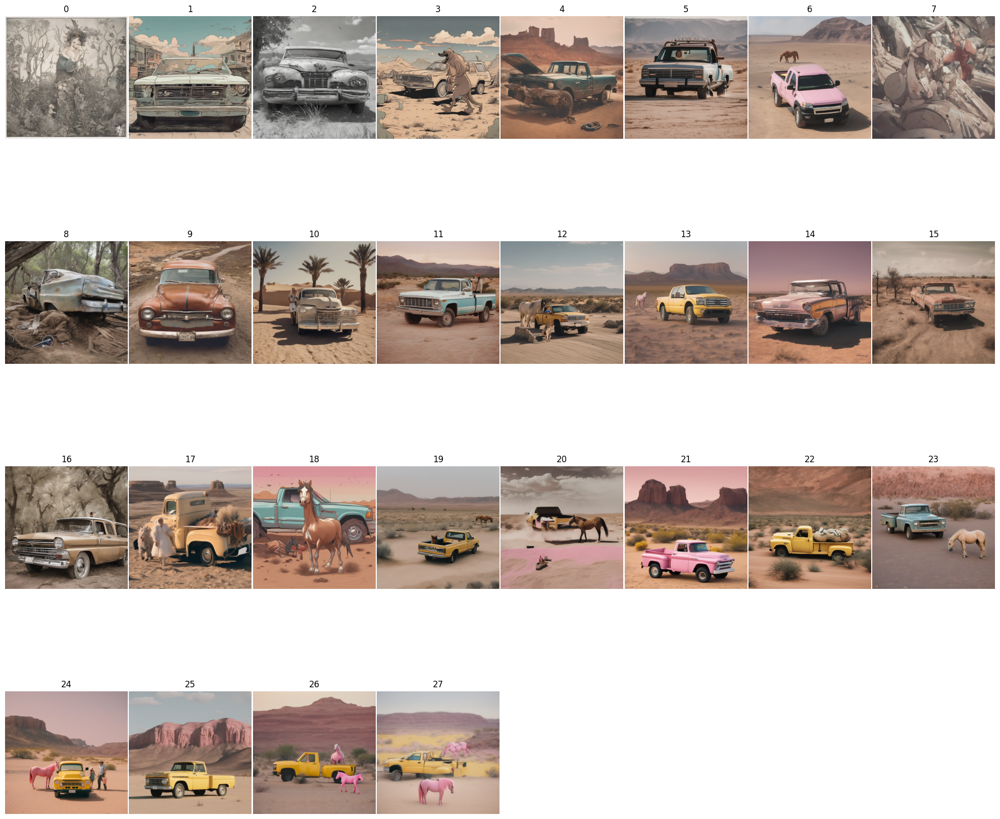

In [47]:
make_grid(images, nrow=4)